# Biomechanical User Modelling and Simulation



## This notebook can only be run in Google Colab.
Please download this notebook and upload it to Google Colab to run :
https://colab.research.google.com/

Or you can just use this shared link to launch the notebook :
https://drive.google.com/file/d/1ZhHT5EkZGQF2k9rQzXy4uZxEfAGJYi9Z/view?usp=sharing

## Some key concepts




### Reinforcement learning

* Area of machine learning; studies how agents should interact with their environment to maximize cumulative rewards

* Models the optimization problems as Markov decision processes (MDP)

  * *At each time step **t**, the process is in some state **s**, and the decision maker may choose any action **a** that is available in the state. The process responds at the next time step by randomly moving into a new state **s'**, and giving the decision maker a corresponding reward **r** .*

<img src="https://miro.medium.com/max/1400/1*7cuAqjQ97x1H_sBIeAVVZg.webp" height="200" />

* Policy: A (deterministic or stochastic) mapping from states to actions. Nowadays typically a neural network. This is what is learned during the training process.

### [MuJoCo](https://mujoco.readthedocs.io/en/latest/overview.html)

* General purpose physics engine for **fast and accurate** simulation of articulated structures interacting with their environment

* Used by robotics, graphics, biomechanics, machine learning researchers


### [OpenAI Gym / Farama Gymnasium](https://github.com/Farama-Foundation/Gymnasium)

* Python library for developing and comparing reinforcement learning algorithms by providing a **standard API** to communicate between learning algorithms and environments


gym.drawio.svg



## [User-in-the-Box](https://github.com/aikkala/user-in-the-box)


* Open source code for modeling and simulating HCI interaction tasks in MuJoCo.

* The user is modeled with a muscle-actuated biomechanical model with perception capabilities (e.g. egocentric vision), and is trained with reinforcement learning to solve the interaction task.

* Provides a flexible (modular) approach to implementing new biomechanical models, perception models, and interaction tasks.

* The produced simulators are designed to run as standalone packages that can be easily shared with others


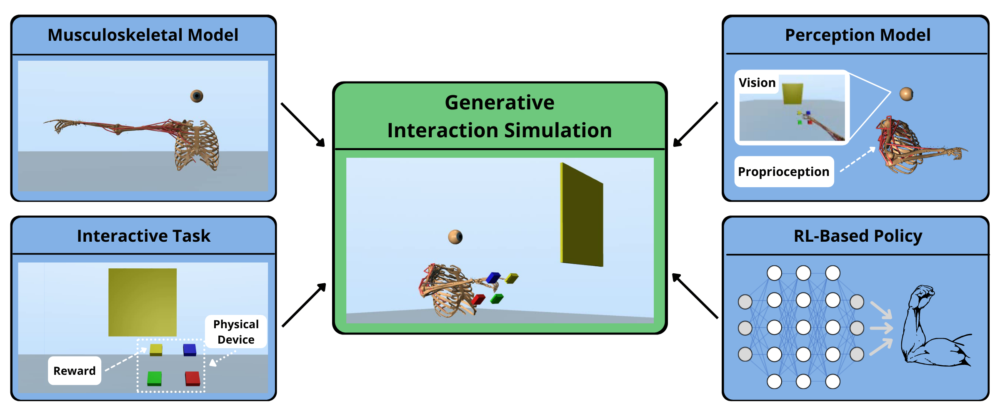

### Biomechanical models

* Structure comprised of bones (bodies, geoms in MuJoCo) and joints that define how they move with relation to each other.
* Force generation through tendons and muscles; tendons are inelastic and contract/relax as determined by muscle parameterisation
* [Follow this link](https://github.com/aikkala/user-in-the-box/blob/main/uitb/bm_models/mobl_arms_index/bm_model.xml) for an example of a MuJoCo XML file

### Perception models

Perception model is a collection of perception modules. A module can be a representation of e.g.

* vision (like an egocentric camera)
* proprioception (joint angles, velocities, accelerations, muscle internal states)
* touch (force sensors)

These are also implemented in MuJoCo (e.g. camera, force sensors).


### Interactive tasks

* May contain physical models of interaction devices (3D models of devices). MuJoCo is pretty flexible, almost all kinds of interaction can be modelled(?)
* Defines the reward function, which determines what kind of reward the user receives when interacting with the environment
* See the GitHub repo for [examples](https://github.com/aikkala/user-in-the-box#pointing-examples)


### RL training loop

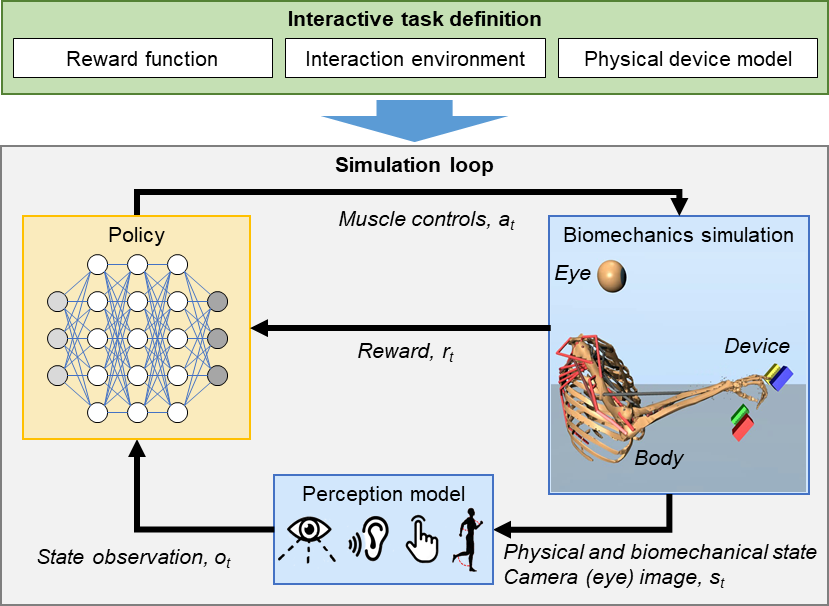

### Reward function design

* Using RL to model human behaviour is based on the computational rationality viewpoint that humans try to maximize a utility function. This utility function corresponds to the expected cumulative reward in RL

* Designing reward functions is challenging. Some tricks to make learning the problem easier

  * [Early termination of episodes](#early_termination)
  * [Reward shaping](#reward_shaping)
  * Curriculum learning

### Hierarchical RL (control)

In the four example tasks (pointing, tracking, ...) the user model has to begin learning from scratch everytime we start RL training. It must learn how to move its arm again every time, which may make training times longer, and is not particularly realistic.

With hierarchical RL approach, we can learn separately a task agnostic *low level controller (LLC)*, and a task specific *high level controller (HLC)*

* LLC: input target pose into policy, outputs muscle controls
* HLC: input observation into policy, outputs target pose for LLC

This way we only need to learn once how to move the arm, and HLCs learn which movements maximize task specific rewards.

**[Demo of an LLC for the arm model]**


### Software architecture

architecture.svg

## Setup notebook

---

**IMPORTANT** You must run this notebook with GPU enabled. To make sure GPU is enabled:

1. Click on *Runtime* (*Suorituspalvelu*) tab at the top of the page
2. Click on *Change runtime type* (*Muuta suorituspalvelun tyyppiä*)
3. Select *GPU* as *hardware accelerator* (*laitteistokiihdytin*), and click *save*
4. If you aren't connected automatically, click on the *Connect* button in the top right corner of the page (If you are connected, there will be a green checkmark with RAM and Disk utilisation displayed in the top right corner instead)

Also note that all files, installations, etc will be deleted if you disconnect from Colab, or if you are inactive for too long.

---



In [10]:
# Firstly:
# Install condalab and miniconda
# This cell must be executed first, because it will restart the kernel!
# The restart will prompt Colab to issue an "Your session crashed for an unknown
# reason" warning; you can ignore this.

!pip install -q condacolab
import condacolab
condacolab.install_miniconda()

⏬ Downloading https://repo.anaconda.com/miniconda/Miniconda3-py310_23.11.0-2-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:23
🔁 Restarting kernel...


### Restart the kernel before next step.

Please click *Runtime -> Restart session*

### Setting up resources

In [1]:
# And then:
# Run this cell to finish the setup.
# NOTE! This cell takes a long time to run, something like 10-15 minutes
!echo "" > /usr/local/conda-meta/pinned

# cd first to /content (this is your current pwd unless you have cd'd yourself
# elsewhere)
%cd /content

# Clone user-in-the-box
!git clone -b gym_setting https://github.com/aikkala/user-in-the-box.git

# cd into the cloned folder
%cd user-in-the-box

# Create the conda env (installs Python packages required to run
# user-in-the-box)
!conda install python=3.11 -y
!conda env update --name base --file conda_env.yml

# Set some environment variables so that Python can find user-in-the-box
# installation, and the correct backend is used for rendering

%env PYTHONPATH="$/env/python:/content/user-in-the-box:"
%env MUJOCO_GL=egl

# Define a helper function to show mp4 videos
from IPython.display import HTML
from base64 import b64encode
import os
def show_video(video_path):

  # Temporary path for compressed video
  compressed_path = "/content/tmp_compressed.mp4"

  # Compress with ffmpeg
  os.system(f"ffmpeg -y -i {video_path} -vcodec libx264 {compressed_path}")

  # Show video
  mp4 = open(compressed_path,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML("""
  <video width=400 controls>
        <source src="%s" type="video/mp4">
  </video>
  """ % data_url)

/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
/content
/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
fatal: destination path 'user-in-the-box' already exists and is not an empty directory.
/content/user-in-the-box
/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
Channels:
 - defaults
Platform: linux-64
Solving environment: / - \ done

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - python=3.11


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    archspec-0.2.3             |     pyhd3eb1b0_0          47 KB
    boltons-23.0.0             |  py311h06a4308_0         477 KB
    brotli-python-1.0.9        |  py311h6a678d5_8         358 KB
    ca-certificates-2024.11.26 |       h06a4308_0         131 KB

Setup finished!

----

In [8]:
# Check which directory in
%ls

conda_env.yml  HRL_README.md    LICENSE    setup.py     uitb/
figs/          INSTALLATION.md  README.md  simulators/  uitb_testing.ipynb


In [ ]:
#Unneccesary to run this
%cd user-in-the-box

## Exercises


In these exercises we will

**Task 1a** Run the pointing model with two different action sampling frequencies. The action sampling frequency determines how often an action is sampled from the learned policy. A lower action sampling frequency means the simulations run faster, and may mitigate the [credit assignment problem in RL](https://ai.stackexchange.com/questions/12908/what-is-the-credit-assignment-problem), but the resulting movements are laggier and jerkier. In part **1b** we'll plot the (x,y,z) coordinates of the end-effector for both simulations, and in part **1c** we compare the average muscle activations for each run

**Task 2** Run the tracking model with a prespecified (circular) trajectory

----

We will use the script `uitb/test/evaluator.py` to run simulations of a pre-trained pointing model. See the cell below (or run it) for a breakdown of input arguments for the function

In [3]:
!python uitb/test/evaluator.py

/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
usage: evaluator.py [-h] [--action_sample_freq ACTION_SAMPLE_FREQ] [--checkpoint CHECKPOINT]
                    [--num_episodes NUM_EPISODES] [--record] [--out_file OUT_FILE] [--logging]
                    [--state_log_file STATE_LOG_FILE] [--action_log_file ACTION_LOG_FILE]
                    simulators
evaluator.py: error: the following arguments are required: simulators


The `simulator_folder` that the script expects is `simulators/mobl_arms_index_pointing` in Task 1a, and `simulators/mobl_arms_index_tracking` in Task 2. If we want to simulate for one episode with (video) recording and logging enabled, and sample actions from the RL policy with a frequency of 100 (Hz), we would call the script with parameters `--num_episodes 1 --logging --record --action_freq_sample 100`.

Run the cell below for an example of how to call the `uitb/test/evalutor.py` script.

In [4]:
!python uitb/test/evaluator.py \
    simulators/mobl_arms_index_tracking \
    --num_episodes 1 \
    --record \
    --action_sample_freq 20

/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
run parameters are: {'callbacks': [{'name': 'freq_curriculum', 'cls': 'rl.sb3.callbacks.LinearCurriculum', 'kwargs': {'start_value': 0, 'end_value': 1, 'start_timestep': 40000000, 'end_timestep': 80000000}}], 'evaluate': True, 'frame_skip': 25, 'dt': 0.05, 'action_sample_freq': 20.0, 'rendering_context': <mobl_arms_index_tracking.utils.rendering.Context object at 0x7ca845fc4950>}

Loading model: simulators/mobl_arms_index_tracking/checkpoints/model_100000000_steps.zip

Run episode 1/1.
A recording has been saved to file simulators/mobl_arms_index_tracking/evaluate/evaluate.mp4


When the script is called with `--logging` and `--record`, it outputs a video file and log files. These files will be saved in folder /content/user-in-the-box/simulators/mobl_arms_index_pointing/evaluate/. The log files are called *state_log.pickle* and *action_log.pickle*, and the video file *evaluate.mp4*.

In this exercise we will analyse the log files. Note that running `uitb/test/evaluator.py` always writes videos and logs into the same files -- unless you specify the `--out_file`, `--state_log_file`, and `--action_log_file` arguments. So make sure to download/rename the log files before you run the `evaluator.py` script again.

You can also download the `evaluate.mp4` video file to view a recording of the simulation, or, alternatively, see the cell below for an example of how to call `show_video` function to display the video inside this notebook. Run the function in a new cell to preserve existing videos.

In [5]:
show_video("/content/user-in-the-box/simulators/mobl_arms_index_pointing/evaluate/evaluate.mp4")

----

### Task 1a (data collection)

In this task we run the simulation twice, with different action sampling frequencies

Before running the `evaluator.py` script, we must modify it a bit. After line 83 in file /content/user-in-the-box/uitb/test/evaluator.py (click to open), add the following line

```python
run_params["random_seed"] = 1
```

Now the targets will be spawned in the same places when we run the simulation twice.

1. Run the `uitb/test/evaluator.py` script as demonstrated above (using `--num_episodes 1 --logging --record --action_sample_freq 100`). Download/rename the log files.

2. Run the script again, but this time set `--action_sample_freq 20`. Now actions from the policy (which control the muscles) are sampled five times less frequently. Again, download/rename the files.


Firtst we evaluate sample frequency 20:

In [6]:
### create a new folder for frequency=20
!mkdir simulators/mobl_arms_index_pointing/evaluate/freq_20

### evaluate this frequency
!python uitb/test/evaluator.py \
    simulators/mobl_arms_index_pointing \
    --num_episodes 1 \
    --logging \
    --record \
    --action_sample_freq 20 \
    --out_file freq_20/evaluate.mp4 \
    --state_log_file freq_20/state_log \
    --action_log_file freq_20/action_log

### show the video of the simulation
#show_video("/content/user-in-the-box/simulators/mobl_arms_index_pointing/evaluate/freq_20/evaluate.mp4")

/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
run parameters are: {'action_sample_freq': 20.0, 'random_seed': 1, 'dt': 0.05, 'evaluate': True, 'frame_skip': 25, 'rendering_context': <mobl_arms_index_pointing.utils.rendering.Context object at 0x7c9c9dbb7e90>}

Loading model: simulators/mobl_arms_index_pointing/checkpoints/model_100000000_steps.zip

Run episode 1/1.
Log files have been saved files simulators/mobl_arms_index_pointing/evaluate/freq_20/state_log.pickle and simulators/mobl_arms_index_pointing/evaluate/freq_20/action_log.pickle
A recording has been saved to file simulators/mobl_arms_index_pointing/evaluate/freq_20/evaluate.mp4


Then we evaluate sample frequency 100:

In [7]:
## Run this only after adding the line 84 the random_seed = 1
### create a new folder for frequency=100
!mkdir simulators/mobl_arms_index_pointing/evaluate/freq_100

### evaluate this frequency
!python uitb/test/evaluator.py \
    simulators/mobl_arms_index_pointing \
    --num_episodes 1 \
    --logging \
    --record \
    --action_sample_freq 100 \
    --out_file freq_100/evaluate.mp4 \
    --state_log_file freq_100/state_log \
    --action_log_file freq_100/action_log

### show the video of the simulation
#show_video("/content/user-in-the-box/simulators/mobl_arms_index_pointing/evaluate/freq_100/evaluate.mp4")

/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
run parameters are: {'frame_skip': 5, 'action_sample_freq': 100.0, 'random_seed': 1, 'evaluate': True, 'dt': 0.01, 'rendering_context': <mobl_arms_index_pointing.utils.rendering.Context object at 0x7fca461ca850>}

Loading model: simulators/mobl_arms_index_pointing/checkpoints/model_100000000_steps.zip

Run episode 1/1.
Log files have been saved files simulators/mobl_arms_index_pointing/evaluate/freq_100/state_log.pickle and simulators/mobl_arms_index_pointing/evaluate/freq_100/action_log.pickle
A recording has been saved to file simulators/mobl_arms_index_pointing/evaluate/freq_100/evaluate.mp4


After all we compare the two videos:

In [8]:
### sample_freq 20
show_video("/content/user-in-the-box/simulators/mobl_arms_index_pointing/evaluate/freq_20/evaluate.mp4")

In [9]:
### sample_freq 100
show_video("/content/user-in-the-box/simulators/mobl_arms_index_pointing/evaluate/freq_100/evaluate.mp4")

### Task 1b (data analysis)

In this task we analyse the "state_log.pickle" files collected in Task 1a. We plot the (x,y,z) coordinates of the end-effector for both simulations (action sample frequency being 20 Hz or 100 Hz), to see how the smoothness of movements vary. You can do these anlyses in any way you want (on your own computer, using any software), but note that you need `pickle` to read the log files.



1. Once you have downloaded the log files, you can read them by doing

  ```python
  import pickle
  with open(path_to_log_file, 'rb') as file:
    data = pickle.load(file)
  ```

  If you have the Python script in the same location as the downloaded log files, the variable `path_to_log_file` would just be `"state_log.pickle"`.



2.   Read the keys `timestep` and `hand_2distph_xpos` in `episode_0` with
```python
import numpy
timestep = np.asarray(data["episode_0"]["timestep"])
ee = np.asarray(data["episode_0"]["hand_2distph_xpos"])
```
The key `timestep` gives you the elapsed (simulated) time in seconds, and `hand_2distph_xpos` are the (x,y,z) coordinates of the end-effector (fingertip).

#### Read and show the result  
Use the above to read the timestep and end-effector position for both simulations (action sample freq being 20 or 100).


In [6]:
%ls

drive/  sample_data/


In [10]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# Load the data
with open('simulators/mobl_arms_index_pointing/evaluate/freq_100/state_log.pickle', 'rb') as file:
    data100 = pickle.load(file)

with open('simulators/mobl_arms_index_pointing/evaluate/freq_20/state_log.pickle', 'rb') as file:
    data20 = pickle.load(file)

# Then extract the data
t100 = np.asarray(data100["episode_0"]["timestep"])
ee100 = np.asarray(data100["episode_0"]["hand_2distph_xpos"])

t20 = np.asarray(data20["episode_0"]["timestep"])
ee20 = np.asarray(data20["episode_0"]["hand_2distph_xpos"])

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Plot the x coordinate from both simulations as a function of time (plot both in the same figure). Repeat for y and z coordinates.


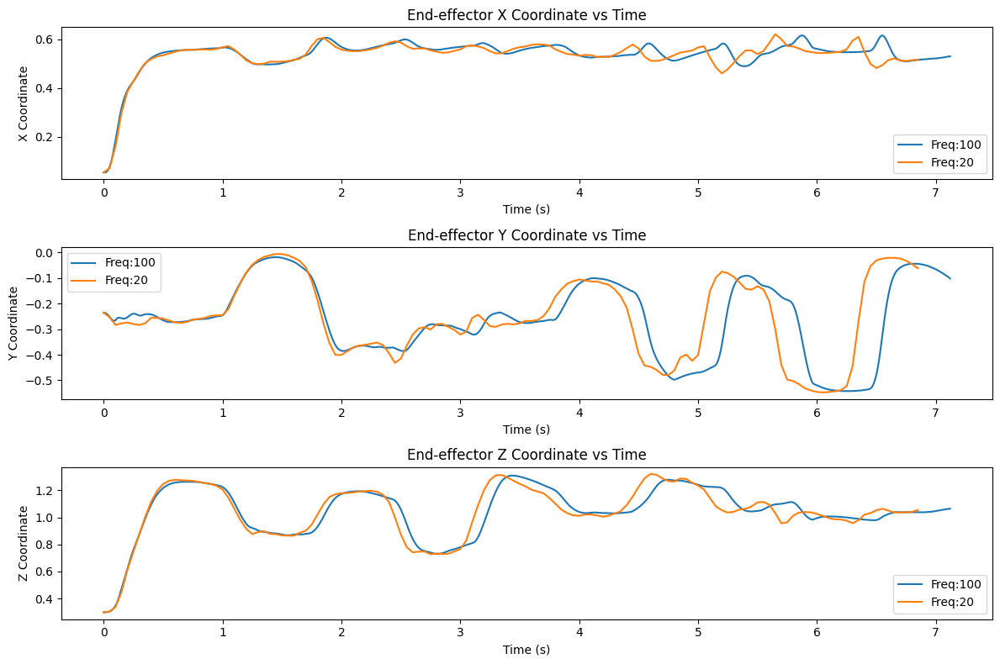

In [12]:
# plot the figures
plt.figure(figsize=(12, 8))

# x-coordinate
plt.subplot(3, 1, 1)
plt.plot(t100, ee100[:, 0], label='Freq:100')
plt.plot(t20, ee20[:, 0], label='Freq:20')
plt.xlabel('Time (s)')
plt.ylabel('X Coordinate')
plt.legend()
plt.title('End-effector X Coordinate vs Time')

# y-coordinate
plt.subplot(3, 1, 2)
plt.plot(t100, ee100[:, 1], label='Freq:100')
plt.plot(t20, ee20[:, 1], label='Freq:20')
plt.xlabel('Time (s)')
plt.ylabel('Y Coordinate')
plt.legend()
plt.title('End-effector Y Coordinate vs Time')

# z-coordinate
plt.subplot(3, 1, 3)
plt.plot(t100, ee100[:, 2], label='Freq:100')
plt.plot(t20, ee20[:, 2], label='Freq:20')
plt.xlabel('Time (s)')
plt.ylabel('Z Coordinate')
plt.legend()
plt.title('End-effector Z Coordinate vs Time')

plt.tight_layout()
plt.show()

### Task 1c (data analysis)

1. As in Task 1b, read the key `act` for both runs. `act` contains the muscle activation value for each timestep, and for each of the 26 muscles. Calculate the average activation value for both runs.





In [13]:
# Extract muscle activation data
act20 = np.asarray(data20["episode_0"]["act"])
act100 = np.asarray(data100["episode_0"]["act"])

# Calculate the average activation value
avg_act20 = np.mean(act20, axis=0)
avg_act100 = np.mean(act100, axis=0)

2. Do a bar plot with the average muscle activations plotted for all 26 muscles in both runs.

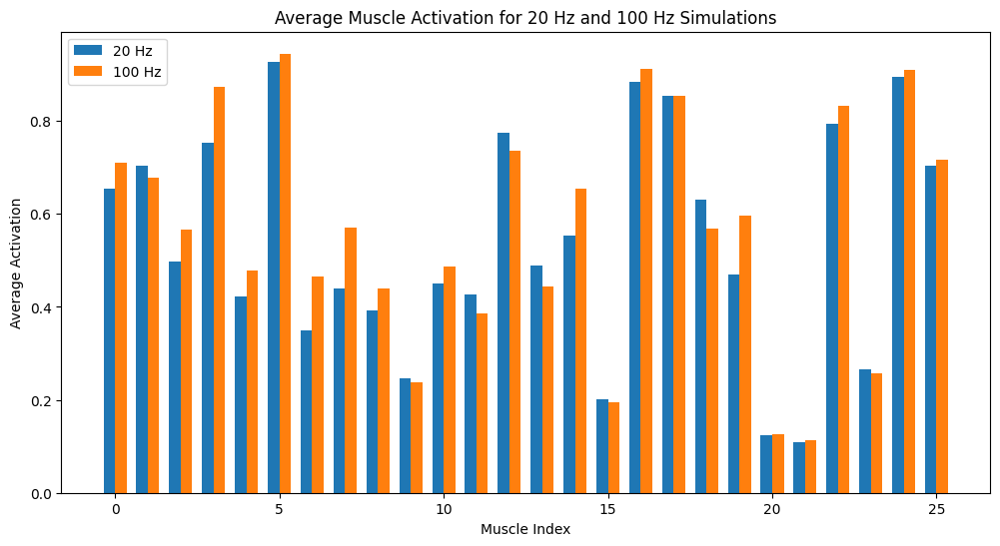

In [14]:
# plot a bar chart
plt.figure(figsize=(12, 6))
bar_width = 0.35
index = np.arange(26)

plt.bar(index - bar_width/2, avg_act20, bar_width, label='20 Hz')
plt.bar(index + bar_width/2, avg_act100, bar_width, label='100 Hz')

plt.xlabel('Muscle Index')
plt.ylabel('Average Activation')
plt.title('Average Muscle Activation for 20 Hz and 100 Hz Simulations')
plt.legend()
plt.show()

---

### Task 2

Let's have a look at the `mobl_arms_index_tracking` simulator. In this task the user follows a target whose trajectory is randomly generated on a 2D plane in front of the user. As previously, run `uitb/test/evaluator.py`, but this time with the `mobl_arms_index_tracking` simulator. Set the rest of the parameters to `--num_episodes 1 --record --action_sample_freq 100`. Use the `show_video` function to see what the simulation looks like.


Note: This isn't supposed to be a difficult task. This can be comfortably implemented in three lines of code.


#### 1. Open the file

/content/user-in-the-box/simulators/mobl_arms_index_tracking/mobl_arms_index_tracking/tasks/tracking/Tracking.py



#### 2. Edit and evaluate
 The function `_generate_trajectory(self)` returns two values: y coordinate and z coordinate of the target, with respect to a 2D plane defined in front of the user. Modify this function such that it returns the y and z coordinates of a circular motion, i.e., the target should follow a circular trajectory in the 2D plane. The returned coordinates should define a circle with radius of 0.2 (m), i.e., the returned coordinates should have values that range between [-0.2, 0.2]. You can run the `evaluator.py` with `--action_sample_freq 20` to make the simulations (and video recordings) faster.



You should find line 117 and edit the `_generate_trajectory` function with the code below:

```
def _generate_trajectory(self, speed_factor=1.0):
    t = np.linspace(0, 2 * np.pi * speed_factor, int(self._max_episode_steps) + 1)  # +1 to match _generate_sine_wave length
    radius = 0.2
    sin_y = radius * np.sin(t)
    sin_z = radius * np.cos(t)
    return sin_y, sin_z
```
Then run this code block below to evaluate and show the video:


In [15]:
### Evaluate
!python uitb/test/evaluator.py \
    simulators/mobl_arms_index_tracking \
    --num_episodes 1 \
    --record \
    --action_sample_freq 100 # You can edit the sample_freq

### Show video
show_video("/content/user-in-the-box/simulators/mobl_arms_index_tracking/evaluate/evaluate.mp4")

/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
run parameters are: {'callbacks': [{'name': 'freq_curriculum', 'cls': 'rl.sb3.callbacks.LinearCurriculum', 'kwargs': {'start_value': 0, 'end_value': 1, 'start_timestep': 40000000, 'end_timestep': 80000000}}], 'evaluate': True, 'action_sample_freq': 100.0, 'frame_skip': 5, 'dt': 0.01, 'random_seed': 1, 'rendering_context': <mobl_arms_index_tracking.utils.rendering.Context object at 0x7c74ee114090>}

Loading model: simulators/mobl_arms_index_tracking/checkpoints/model_100000000_steps.zip

Run episode 1/1.
A recording has been saved to file simulators/mobl_arms_index_tracking/evaluate/evaluate.mp4


#### 3. Try different velocities

Once you have the correct trajectory implemented, test out different velocities for the target.


You should edit the `speed_factor` of `def _generate_trajectory(self, speed_factor=1.0):`

Then try different velocities and rerun code block to evaluate them again:

In [22]:
### Evaluate
## Run this after changing the speed factor to 2.0
!python uitb/test/evaluator.py \
    simulators/mobl_arms_index_tracking \
    --num_episodes 1 \
    --record \
    --action_sample_freq 100 # You can edit the sample_freq

### Show video
show_video("/content/user-in-the-box/simulators/mobl_arms_index_tracking/evaluate/evaluate_speed2.mp4")

/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
run parameters are: {'frame_skip': 5, 'random_seed': 1, 'dt': 0.01, 'evaluate': True, 'action_sample_freq': 100.0, 'callbacks': [{'name': 'freq_curriculum', 'cls': 'rl.sb3.callbacks.LinearCurriculum', 'kwargs': {'start_value': 0, 'end_value': 1, 'start_timestep': 40000000, 'end_timestep': 80000000}}], 'rendering_context': <mobl_arms_index_tracking.utils.rendering.Context object at 0x79fb7248cb50>}

Loading model: simulators/mobl_arms_index_tracking/checkpoints/model_100000000_steps.zip

Run episode 1/1.
A recording has been saved to file simulators/mobl_arms_index_tracking/evaluate/evaluate.mp4


In [21]:
### Evaluate
## Run this after changing the speed factor to 0.5
!python uitb/test/evaluator.py \
    simulators/mobl_arms_index_tracking \
    --num_episodes 1 \
    --record \
    --action_sample_freq 100 # You can edit the sample_freq

### Show video
show_video("/content/user-in-the-box/simulators/mobl_arms_index_tracking/evaluate/evaluate_speed05.mp4")

/bin/bash: /usr/local/lib/libtinfo.so.6: no version information available (required by /bin/bash)
run parameters are: {'dt': 0.01, 'action_sample_freq': 100.0, 'frame_skip': 5, 'evaluate': True, 'callbacks': [{'name': 'freq_curriculum', 'cls': 'rl.sb3.callbacks.LinearCurriculum', 'kwargs': {'start_value': 0, 'end_value': 1, 'start_timestep': 40000000, 'end_timestep': 80000000}}], 'random_seed': 1, 'rendering_context': <mobl_arms_index_tracking.utils.rendering.Context object at 0x7f678fbfc310>}

Loading model: simulators/mobl_arms_index_tracking/checkpoints/model_100000000_steps.zip

Run episode 1/1.
A recording has been saved to file simulators/mobl_arms_index_tracking/evaluate/evaluate.mp4


---
## Some figures

### Early termination

<a name="early_termination"></a>

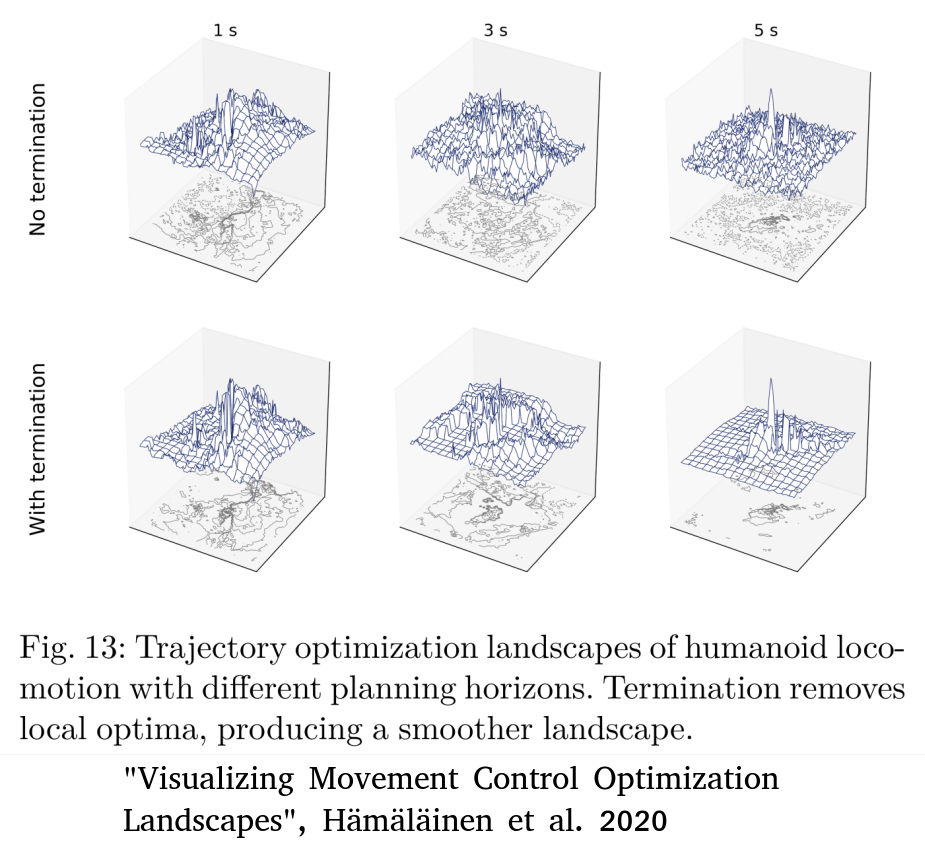

### Reward shaping (example: pointing task)

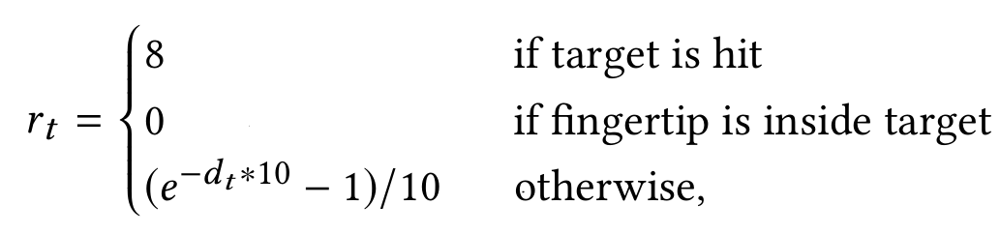

<a name="reward_shaping"></a>

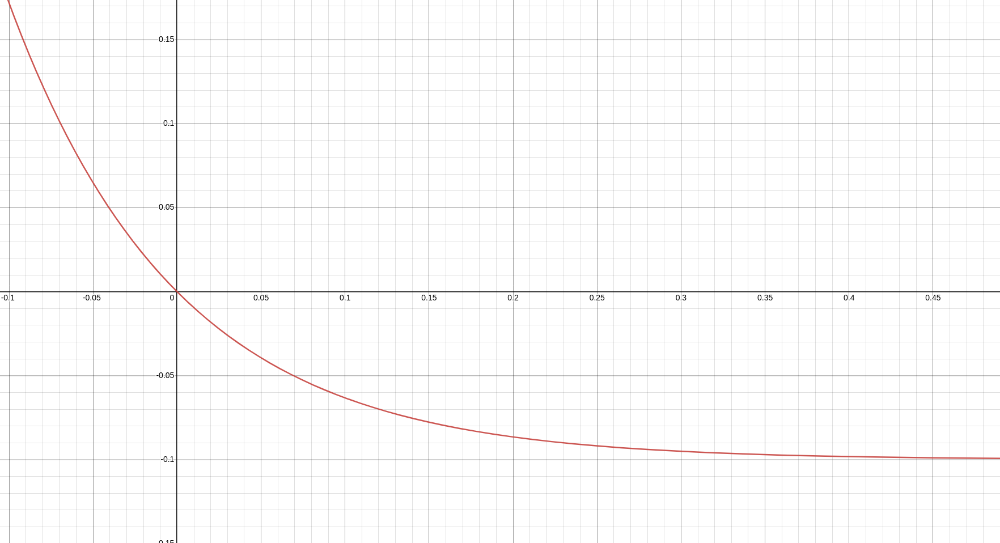

Ignore this block. This is for Maunal Grading for your report